In [1]:
# Baixa e extrai o dataset
!mkdir data/
!curl -L -o data/animais.zip "https://drive.google.com/uc?export=download&id=16Lll0Slg1unWxAb26AzZqI9sPdB_fYpV"
!unzip data/animais.zip -d data

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 11.6M  100 11.6M    0     0  2029k      0  0:00:05  0:00:05 --:--:-- 2616k
Archive:  data/animais.zip
   creating: data/animais/
   creating: data/animais/val/
   creating: data/animais/val/tatu/
  inflating: data/animais/val/tatu/10242.jpg  
  inflating: data/animais/val/tatu/10209.jpg  
  inflating: data/animais/val/tatu/10251.jpg  
  inflating: data/animais/val/tatu/10202.jpg  
  inflating: data/animais/val/tatu/10243.jpg  
  inflating: data/animais/val/tatu/10215.jpg  
  inflating: data/animais/val/tatu/10254.jpg  
  inflating: data/animais/val/tatu/10241.jpg  
  inflating: data/animais/val/tatu/10238.jpg  
  inflating: data/animais/val/tatu/10228.jpg  
  inflating: data/animais/val/tatu/10203.jpg  
  inflating: data/animais/val/tatu/10236.jpg  

# Atividade 06

Alunos:
* Raphael Friederich (rfrf@cesar.school)
* Maria Eduarda Alves (meas@cesar.school)

In [2]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Subset
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [4]:
def train_model(model, trainloader, valloader, criterion, optimizer, device=device, num_epochs=5):
    history = {
        'train_losses': [],
        'val_losses': [],
        'train_accuracies': [],
        'val_accuracies': []
    }

    for epoch in range(num_epochs):
        # Treinamento
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        for i, data in tqdm(enumerate(trainloader, 0), total=len(trainloader)):
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_loss = running_loss / len(trainloader)
        train_acc = 100 * correct / total
        history['train_losses'].append(train_loss)
        history['train_accuracies'].append(train_acc)
        print(f'Epoch {epoch+1}, Train Loss: {train_loss:.3f}, Train Accuracy: {train_acc:.2f}%')

        # Validação
        model.eval()
        val_running_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for data in valloader:
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        val_loss = val_running_loss / len(valloader)
        val_acc = 100 * correct / total
        history['val_losses'].append(val_loss)
        history['val_accuracies'].append(val_acc)
        print(f'Epoch {epoch+1}, Val Loss: {val_loss:.3f}, Val Accuracy: {val_acc:.2f}%')

    print('Treinamento concluído')
    return history


def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    ax1.plot(history['train_losses'], label='Train')
    ax1.plot(history['val_losses'], label='Validation')
    ax1.set_title('Loss')
    ax1.legend()

    ax2.plot(history['train_accuracies'], label='Train')
    ax2.plot(history['val_accuracies'], label='Validation')
    ax2.set_title('Accuracy')
    ax2.legend()

    plt.show()


def test_model(model, testloader, device=device):
    correct = 0
    total = 0
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f'Acurácia da rede na base de teste: {100 * correct / total:.2f}%')

In [5]:
# Carregando os datasets
transform_aug = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transform_no_aug = transforms.Compose([
    transforms.Resize(230),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# data_dir = 'data/hymenoptera_data'
data_dir = "data/animais"

train_set = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=transform_aug)
val_set = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=transform_no_aug)

train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=True)

In [6]:
model = models.resnet18()

print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [7]:
# Substituir a última camada
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

100%|██████████| 13/13 [00:04<00:00,  2.97it/s]


Epoch 1, Train Loss: 0.789, Train Accuracy: 50.00%


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1, Val Loss: 0.687, Val Accuracy: 54.10%


100%|██████████| 13/13 [00:02<00:00,  6.17it/s]


Epoch 2, Train Loss: 0.713, Train Accuracy: 52.00%
Epoch 2, Val Loss: 0.724, Val Accuracy: 45.90%


100%|██████████| 13/13 [00:02<00:00,  6.26it/s]


Epoch 3, Train Loss: 0.693, Train Accuracy: 52.75%
Epoch 3, Val Loss: 0.686, Val Accuracy: 53.28%


100%|██████████| 13/13 [00:02<00:00,  5.29it/s]


Epoch 4, Train Loss: 0.687, Train Accuracy: 57.25%
Epoch 4, Val Loss: 0.657, Val Accuracy: 62.30%


100%|██████████| 13/13 [00:02<00:00,  6.17it/s]


Epoch 5, Train Loss: 0.673, Train Accuracy: 56.00%
Epoch 5, Val Loss: 0.654, Val Accuracy: 55.74%
Treinamento concluído


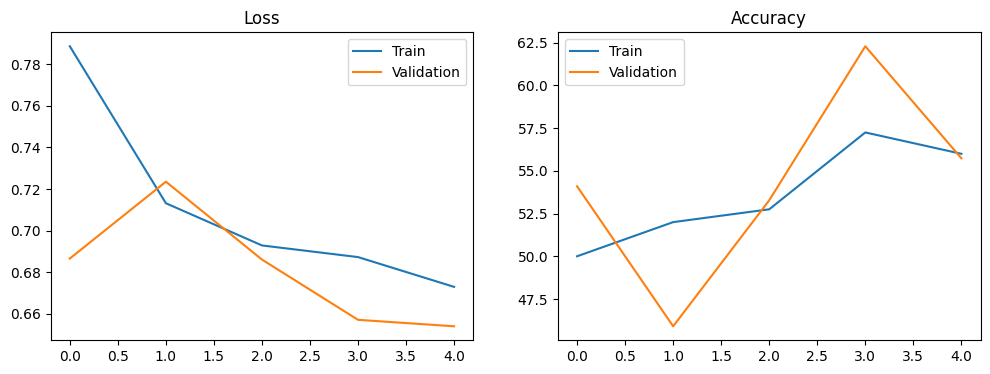

Acurácia da rede na base de teste: 55.74%


In [8]:
# Treinando a CNN
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

history = train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=5)

plot_history(history)
test_model(model, val_loader)

In [9]:
# Utilizando pesos pré-treinados
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 193MB/s]


In [10]:
# Congelar todas as camadas
for param in model.parameters():
    param.requires_grad = False

In [11]:
# Substituir a última camada
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

100%|██████████| 13/13 [00:01<00:00,  9.07it/s]


Epoch 1, Train Loss: 0.640, Train Accuracy: 64.00%
Epoch 1, Val Loss: 0.406, Val Accuracy: 87.70%


100%|██████████| 13/13 [00:02<00:00,  6.28it/s]


Epoch 2, Train Loss: 0.437, Train Accuracy: 83.25%
Epoch 2, Val Loss: 0.262, Val Accuracy: 92.62%


100%|██████████| 13/13 [00:01<00:00,  9.03it/s]


Epoch 3, Train Loss: 0.326, Train Accuracy: 90.25%
Epoch 3, Val Loss: 0.205, Val Accuracy: 94.26%


100%|██████████| 13/13 [00:01<00:00,  8.96it/s]


Epoch 4, Train Loss: 0.268, Train Accuracy: 91.00%
Epoch 4, Val Loss: 0.148, Val Accuracy: 95.90%


100%|██████████| 13/13 [00:02<00:00,  6.12it/s]


Epoch 5, Train Loss: 0.251, Train Accuracy: 91.50%
Epoch 5, Val Loss: 0.166, Val Accuracy: 94.26%
Treinamento concluído


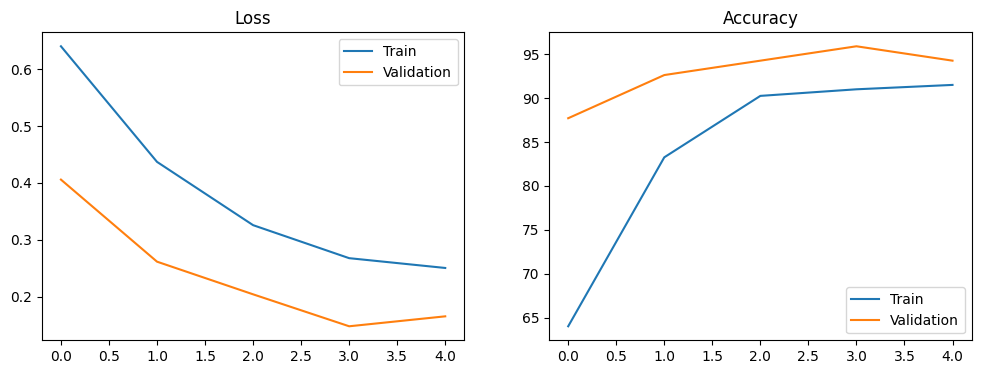

Acurácia da rede na base de teste: 94.26%


In [12]:
# Treinando a CNN
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

history = train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=5)

plot_history(history)
test_model(model, val_loader)

In [13]:
def plot_and_predict(model, image, class_names, device=device):
    model.eval()
    image = image.to(device)
    outputs = model(image.unsqueeze(0))
    _, predicted = torch.max(outputs.data, 1)
    probs = F.softmax(outputs, dim=1)[0] * 100
    prob = probs[predicted].item()

    # image between 0 and 1
    image = torch.clamp(image * 0.225 + 0.45, 0, 1)
    title = f'Classe: {class_names[predicted]} ({prob:.2f}%)'
    plt.imshow(image.permute(1, 2, 0).cpu().numpy())
    plt.title(title)
    plt.axis('off')
    plt.show()

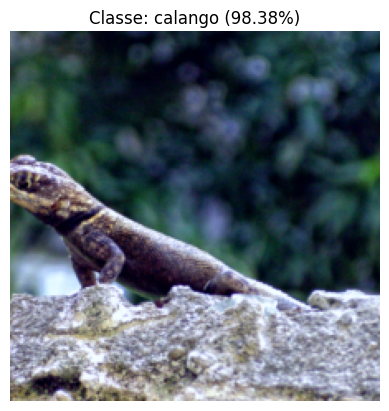

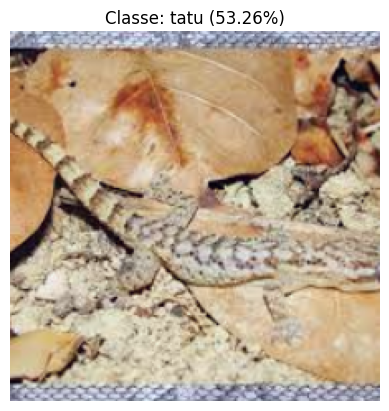

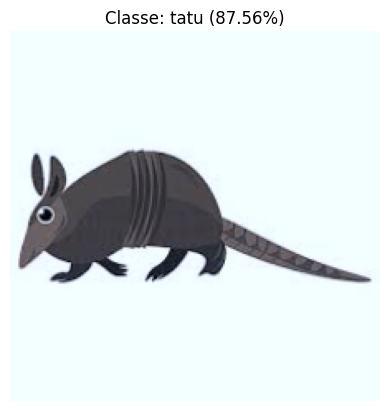

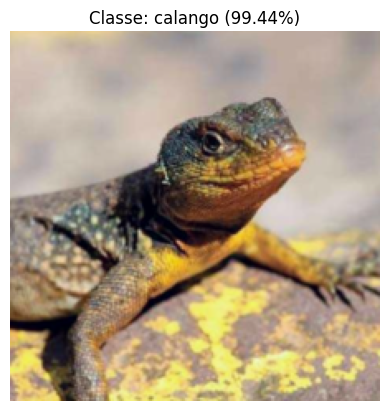

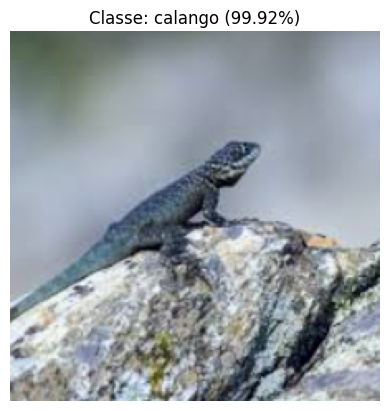

...

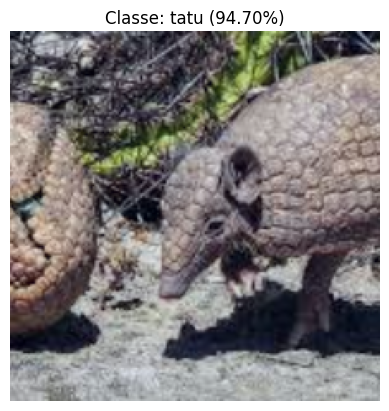

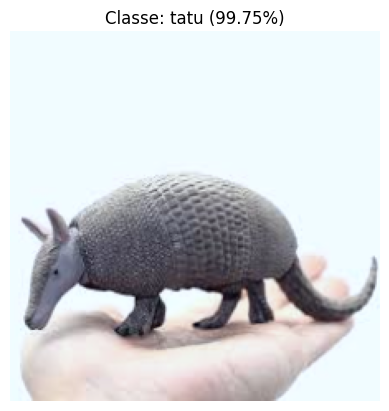

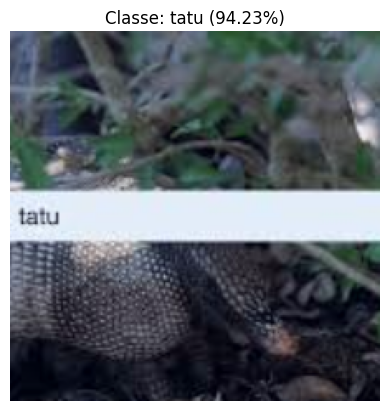

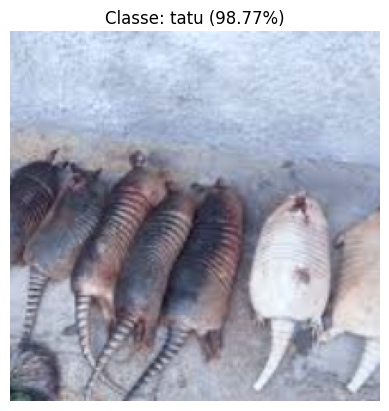

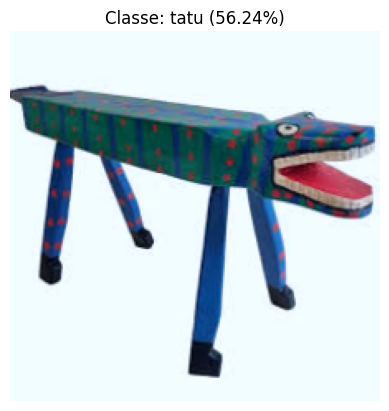

In [14]:
images, labels = next(iter(val_loader))

for image, label in zip(images, labels):
    plot_and_predict(model, image, val_set.classes)

## Exercícios

### Exercício 1
Treine novamente o modelo, mas sem data augmentation. Compare as curvas de treinamento de ambos os casos e comente.

In [23]:
# Carregando os datasets
# transform_aug = transforms.Compose([
#     transforms.RandomResizedCrop(224),
#     transforms.RandomHorizontalFlip(),
#     transforms.ToTensor(),
#     transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
# ])

transform_no_aug = transforms.Compose([
    transforms.Resize(230),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# data_dir = 'data/hymenoptera_data'
data_dir = "data/animais"

train_set = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=transform_no_aug)
val_set = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=transform_no_aug)

train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=True)

In [24]:
# Utilizando pesos pré-treinados
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Congelar todas as camadas
for param in model.parameters():
    param.requires_grad = False

In [25]:
# Substituir a última camada
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

100%|██████████| 13/13 [00:02<00:00,  6.33it/s]


Epoch 1, Train Loss: 0.634, Train Accuracy: 64.75%
Epoch 1, Val Loss: 0.378, Val Accuracy: 86.07%


100%|██████████| 13/13 [00:01<00:00,  8.46it/s]


Epoch 2, Train Loss: 0.377, Train Accuracy: 83.00%
Epoch 2, Val Loss: 0.337, Val Accuracy: 81.97%


100%|██████████| 13/13 [00:01<00:00,  7.14it/s]


Epoch 3, Train Loss: 0.233, Train Accuracy: 91.25%
Epoch 3, Val Loss: 0.175, Val Accuracy: 95.08%


100%|██████████| 13/13 [00:01<00:00,  8.49it/s]


Epoch 4, Train Loss: 0.202, Train Accuracy: 94.25%
Epoch 4, Val Loss: 0.192, Val Accuracy: 95.90%


100%|██████████| 13/13 [00:01<00:00,  8.56it/s]


Epoch 5, Train Loss: 0.160, Train Accuracy: 96.50%
Epoch 5, Val Loss: 0.150, Val Accuracy: 96.72%
Treinamento concluído


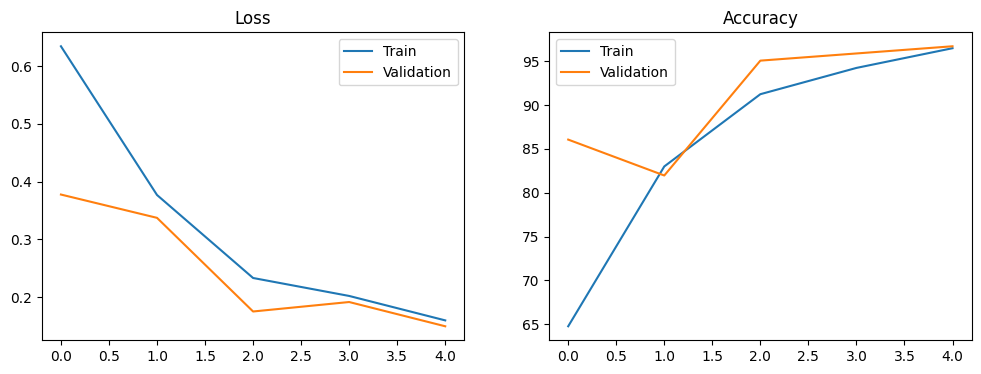

Acurácia da rede na base de teste: 96.72%


In [26]:
# Treinando a CNN
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

history = train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=5)

plot_history(history)
test_model(model, val_loader)

**Observações:**

* Sem a aplicação do data augmentation a acurácia aumentou. O valor do custo convergiu com entre treino e validação assim como também o valor da acurácia. Isto indica que o modelo conseguiu treinar bem e um pouco melhor do que o primeiro com data augmentation.

### Exercício 2
Descongele mais das últimas camadas (à sua escolha), por exemplo `model.layer4[1]`, e treine novamente o modelo.

In [18]:
# Congelar todas as camadas
for param in model.layer3.parameters():
    param.requires_grad = True

In [19]:
# Substituir a última camada
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

100%|██████████| 13/13 [00:02<00:00,  6.09it/s]


Epoch 1, Train Loss: 0.808, Train Accuracy: 53.00%


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1, Val Loss: 0.448, Val Accuracy: 82.79%


100%|██████████| 13/13 [00:01<00:00,  7.93it/s]


Epoch 2, Train Loss: 0.473, Train Accuracy: 77.75%
Epoch 2, Val Loss: 0.234, Val Accuracy: 95.90%


100%|██████████| 13/13 [00:01<00:00,  8.54it/s]


Epoch 3, Train Loss: 0.305, Train Accuracy: 89.25%
Epoch 3, Val Loss: 0.166, Val Accuracy: 98.36%


100%|██████████| 13/13 [00:01<00:00,  8.91it/s]


Epoch 4, Train Loss: 0.247, Train Accuracy: 91.25%
Epoch 4, Val Loss: 0.163, Val Accuracy: 97.54%


100%|██████████| 13/13 [00:01<00:00,  8.57it/s]


Epoch 5, Train Loss: 0.207, Train Accuracy: 91.50%
Epoch 5, Val Loss: 0.119, Val Accuracy: 95.90%
Treinamento concluído


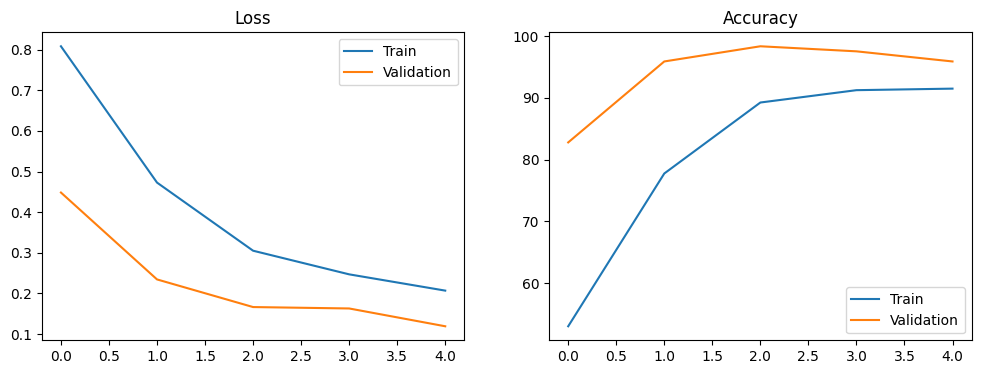

Acurácia da rede na base de teste: 95.90%


In [20]:
# Treinando a CNN
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

history = train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=5)

plot_history(history)
test_model(model, val_loader)

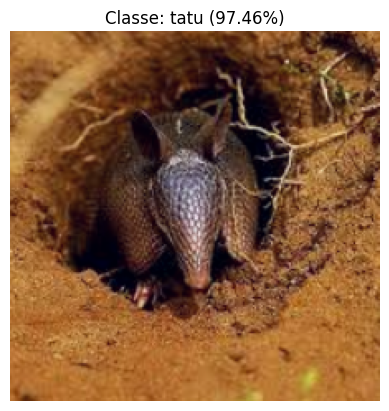

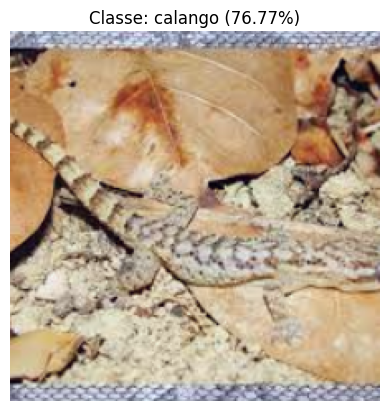

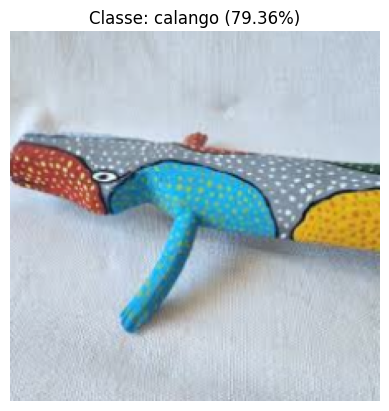

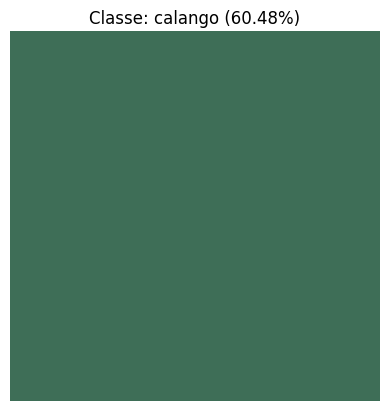

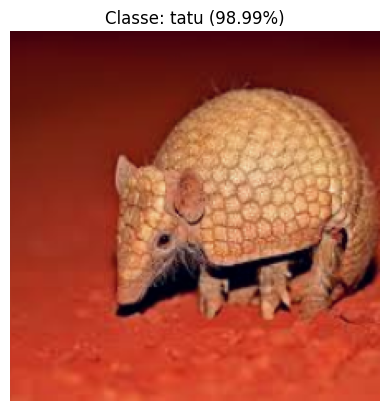

...

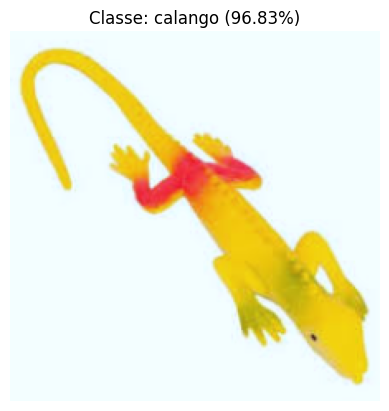

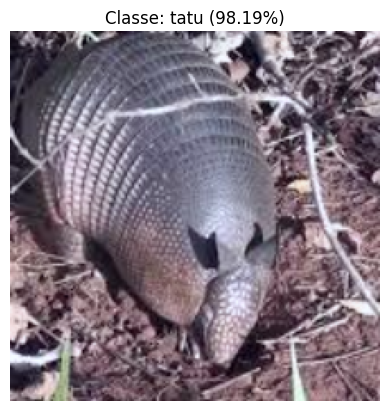

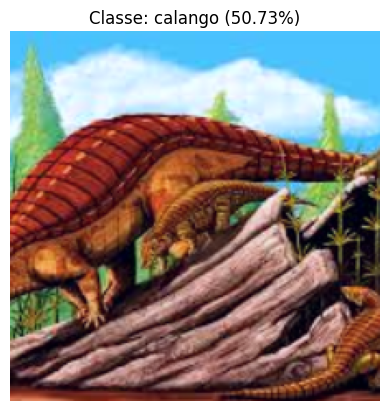

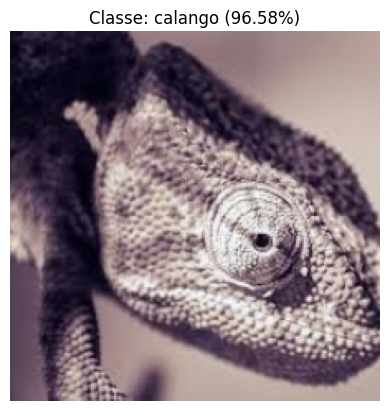

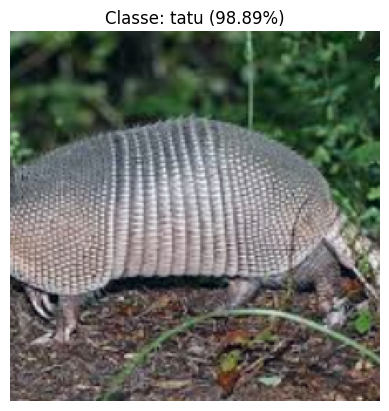

In [21]:
images, labels = next(iter(val_loader))

for image, label in zip(images, labels):
    plot_and_predict(model, image, val_set.classes)

### Exercício 3
Escolha outro modelo pré-treinado dos que foram vistos na aula e substitua no modelo. Lembre-se de alterar a última camada de classificação.

In [27]:
# Carregando os datasets
transform_aug = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transform_no_aug = transforms.Compose([
    transforms.Resize(230),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# data_dir = 'data/hymenoptera_data'
data_dir = "data/animais"

train_set = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=transform_aug)
val_set = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=transform_no_aug)

train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=True)

In [28]:
# modelo resnet50
weights = models.ResNet50_Weights.IMAGENET1K_V2
# Instancia o modelo ResNet50 com os pesos pré-treinados no ImageNet
model_resnet = models.resnet50(weights=weights)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 199MB/s]


In [29]:
# Congelar todas as camadas
for param in model_resnet.parameters():
    param.requires_grad = False

In [30]:
# Substituir a última camada
model_resnet.fc = nn.Linear(model_resnet.fc.in_features, 2)
model_resnet = model_resnet.to(device)

100%|██████████| 13/13 [00:02<00:00,  5.82it/s]


Epoch 1, Train Loss: 0.674, Train Accuracy: 57.75%


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1, Val Loss: 0.612, Val Accuracy: 85.25%


100%|██████████| 13/13 [00:02<00:00,  5.45it/s]


Epoch 2, Train Loss: 0.605, Train Accuracy: 79.00%
Epoch 2, Val Loss: 0.519, Val Accuracy: 97.54%


100%|██████████| 13/13 [00:02<00:00,  5.84it/s]


Epoch 3, Train Loss: 0.532, Train Accuracy: 90.75%
Epoch 3, Val Loss: 0.452, Val Accuracy: 96.72%


100%|██████████| 13/13 [00:02<00:00,  5.67it/s]


Epoch 4, Train Loss: 0.477, Train Accuracy: 89.75%
Epoch 4, Val Loss: 0.402, Val Accuracy: 96.72%


100%|██████████| 13/13 [00:02<00:00,  5.00it/s]


Epoch 5, Train Loss: 0.435, Train Accuracy: 90.50%
Epoch 5, Val Loss: 0.357, Val Accuracy: 97.54%
Treinamento concluído


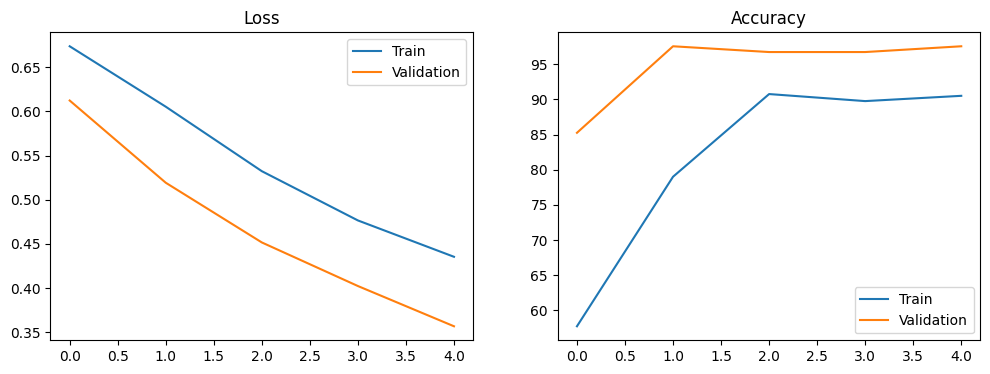

Acurácia da rede na base de teste: 97.54%


In [31]:
# Treinando a CNN
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model_resnet.parameters(), lr=0.001, momentum=0.9)

history = train_model(model_resnet, train_loader, val_loader, criterion, optimizer, device, num_epochs=5)

plot_history(history)
test_model(model_resnet, val_loader)

**Observações:**

A aplicação do modelo resnet50 retornou uma acurácia de 97,54%. Foi descongelada apenas a última camada linear e os dados estavam com a técnica do data augmentation. Contudo, a acurácia da validação está maior do que o de treino e o custo do treino tá maior do que a de validação. Isto pode está acontecendo por causa de alguma regularização, número de épocas e até mesmo o processo de data augmentation.

In [46]:
# Carregando os datasets
transform_aug = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],[0.229, 0.224, 0.225])
])

transform_no_aug = transforms.Compose([
    transforms.Resize(230),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# data_dir = 'data/hymenoptera_data'
data_dir = "data/animais"

train_set = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=transform_aug)
val_set = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=transform_no_aug)

train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=True)

In [48]:
# efficientnet_b0
weights = models.EfficientNet_B0_Weights.IMAGENET1K_V1

model_ef = models.efficientnet_b0(weights=weights)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 161MB/s]


In [49]:
print(model_ef)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [50]:
model_ef.classifier[1]

Linear(in_features=1280, out_features=1000, bias=True)

In [51]:
# Congelar todas as camadas
for param in model_ef.parameters():
    param.requires_grad = False

In [52]:
# Substituir a última camada
model_ef.classifier[1] = nn.Linear(model_ef.classifier[1].in_features, 2)
model_inc = model_ef.to(device)

100%|██████████| 13/13 [00:01<00:00,  7.97it/s]
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1, Train Loss: 0.677, Train Accuracy: 56.25%
Epoch 1, Val Loss: 0.610, Val Accuracy: 73.77%


100%|██████████| 13/13 [00:01<00:00,  8.87it/s]


Epoch 2, Train Loss: 0.593, Train Accuracy: 75.75%
Epoch 2, Val Loss: 0.461, Val Accuracy: 90.98%


100%|██████████| 13/13 [00:01<00:00,  8.97it/s]


Epoch 3, Train Loss: 0.482, Train Accuracy: 88.25%
Epoch 3, Val Loss: 0.383, Val Accuracy: 93.44%


100%|██████████| 13/13 [00:01<00:00,  9.09it/s]


Epoch 4, Train Loss: 0.458, Train Accuracy: 84.50%
Epoch 4, Val Loss: 0.327, Val Accuracy: 95.90%


100%|██████████| 13/13 [00:01<00:00,  7.25it/s]


Epoch 5, Train Loss: 0.389, Train Accuracy: 90.00%
Epoch 5, Val Loss: 0.294, Val Accuracy: 95.90%
Treinamento concluído


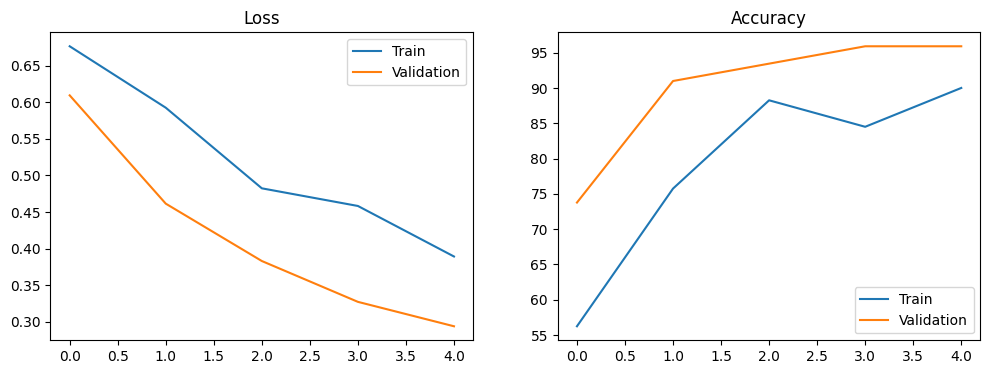

Acurácia da rede na base de teste: 95.90%


In [53]:
# Treinando a CNN
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model_inc.parameters(), lr=0.001, momentum=0.9)

history = train_model(model_ef, train_loader, val_loader, criterion, optimizer, device, num_epochs=5)

plot_history(history)
test_model(model_ef, val_loader)

**Observações**:

A aplicação do modelo efficientnet_b0 trouxe uma acurácia de 95,90%, sendo um pouco menor do que a resnet50. Ela tem uma modificação em relação a sua estrutura pois não conseguimos acessar diretamente a última camada linear, sendo necessário acessá-la no classifier.